In [157]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import plotly.io as pio
import mne
from braindecode.preprocessing import exponential_moving_standardize
import json
import glob
import os
from tqdm import tqdm
import time
from datetime import timedelta

In [4]:
data = list()

for subject in tqdm(glob.glob("../data/DataVIN/Official/*"), desc="subject"):
    for sample in glob.glob(f"{subject}/sample*"):
        try:
            if not os.path.isdir(sample):
                continue

            with open(f"{sample}/eeg.json", mode="r", encoding="utf-8") as f:
                scenario = json.load(f).get("Scenario", "").strip().lower()

            raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=False, verbose=False)
            
            if scenario in {"tôi muốn uống nước", "tôi muốn vệ sinh"}:
                raw.annotations.description[
                    np.where(raw.annotations.description == "Thinking and Acting")[0]
                ] = "Thinking"

            if sample.endswith("K312/sample1"):
                # wrong label "Thinking" (2)
                raw.annotations.description[2] = "Thinking and Acting"

            elif sample.endswith("K360/sample5"):
                # wrong label "Thinking and Acting" (8)
                raw.annotations.description[8] = "Thinking"

            elif sample.endswith("K369/sample6"):
                # wrong label "Thinking and Acting" (8)
                raw.annotations.description[8] = "Thinking"
            
            annotation = pd.DataFrame(raw.annotations)

            a = annotation[annotation["description"] == "Thinking"]
            n_thinking = len(a)
            thinking_min_du = min(a["duration"])
            thinking_max_du = max(a["duration"])
            a = annotation[annotation["description"] == "Thinking and Acting"]
            n_thinking_and_acting = len(a)
            thinking_and_acting_min_du = min(a["duration"]) if n_thinking_and_acting > 0 else np.nan
            thinking_and_acting_max_du = max(a["duration"]) if n_thinking_and_acting > 0 else np.nan
            a = annotation[annotation["description"] == "Resting"]
            n_resting = len(a)
            resting_min_du = min(a["duration"])
            resting_max_du = max(a["duration"])

            data.append((subject[subject.rfind('/') + 1:], sample[sample.rfind('/') + 1:], scenario, n_thinking, n_thinking_and_acting, n_resting, thinking_min_du, thinking_max_du, thinking_and_acting_min_du, thinking_and_acting_max_du, resting_min_du, resting_max_du))
            
        except Exception as e:
            print(f"{sample}:\t{e}")

subject:   0%|                                                                                                | 0/106 [00:00<?, ?it/s]/tmp/ipykernel_11869/149009836.py:12: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=False, verbose=False)
/tmp/ipykernel_11869/149009836.py:12: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=False, verbose=False)
/tmp/ipykernel_11869/149009836.py:12: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=False, verbose=False)
subject:  10%|█████████                                                                              | 11/106 [00:01<00:07, 12.53it/s]/tmp/ipykernel_11869/149009836.py:12: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw =

../data/DataVIN/Official/BN004/sample1:	'description'


subject:  25%|█████████████████████▎                                                                 | 26/106 [00:01<00:04, 16.50it/s]/tmp/ipykernel_11869/149009836.py:12: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=False, verbose=False)
/tmp/ipykernel_11869/149009836.py:12: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=False, verbose=False)
/tmp/ipykernel_11869/149009836.py:12: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=False, verbose=False)
/tmp/ipykernel_11869/149009836.py:12: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=False, verbose=False)
/tmp/ipykernel_11869/149009836.py:12: RuntimeWarning: Limited 

In [5]:
data = pd.DataFrame(data, columns=["subject", "sample", "scenario", "n_thinking", "n_thinking_and_acting", "n_resting", "thinking_min_du", "thinking_max_du", "thinking_and_acting_min_du", "thinking_and_acting_max_du", "resting_min_du", "resting_max_du"])

In [6]:
data = data.sort_values(["subject", "sample", "scenario"])
data

,subject,sample,scenario,n_thinking,n_thinking_and_acting,n_resting,thinking_min_du,thinking_max_du,thinking_and_acting_min_du,thinking_and_acting_max_du,resting_min_du,resting_max_du
309,BN001,sample1,nâng tay trái,3,3,6,7.5944,9.5517,8.4085,9.3085,6.0183,13.6402
312,BN001,sample2,nâng tay phải,3,3,6,7.5728,8.9883,8.5589,13.2307,12.6609,19.2908
305,BN001,sample3,nâng chân trái,3,3,6,6.6956,8.8619,8.1096,8.8097,6.5218,12.7752
306,BN001,sample4,nâng chân phải,3,3,6,6.8635,8.2607,7.7941,8.1075,4.8384,9.3950
307,BN001,sample5,há miệng,3,3,6,6.9023,8.2108,8.7565,10.1461,7.2077,11.7405
...,...,...,...,...,...,...,...,...,...,...,...,...
682,K375,sample5,há miệng,3,3,6,6.4469,6.9809,4.7978,6.3974,3.2833,5.9315
685,K375,sample6,gật đầu,3,3,6,6.4981,7.4799,5.4484,6.0642,3.0646,4.7144
686,K375,sample7,lắc đầu,3,3,6,6.0637,6.8140,5.4981,6.2969,3.1158,4.4804
679,K375,sample8,tôi muốn uống nước,3,0,3,5.7477,6.6318,NaN,NaN,4.6480,5.6643


In [17]:
# data.groupby("subject").count()["sample"]
data[data["subject"] == "BN004"]

,subject,sample,scenario,n_thinking,n_thinking_and_acting,n_resting,thinking_min_du,thinking_max_du,thinking_and_acting_min_du,thinking_and_acting_max_du,resting_min_du,resting_max_du
155,BN004,sample2,nâng tay trái,3,3,6,6.9620,7.7650,6.1516,7.5089,8.0285,10.3084
150,BN004,sample3,nâng tay trái,3,3,6,6.1957,7.7540,4.8805,6.5843,5.4669,8.4073
151,BN004,sample4,nâng chân trái,3,3,6,6.1275,7.2475,6.0459,6.5122,5.6443,8.6261
152,BN004,sample5,há miệng,3,3,6,6.4618,8.0255,5.4957,6.3821,7.3029,11.5786
153,BN004,sample6,gật đầu,3,3,6,6.8614,9.2213,5.1747,5.6617,7.3975,13.2350
154,BN004,sample7,tôi muốn vệ sinh,3,0,3,7.2980,9.4618,NaN,NaN,7.6085,8.6096


/home/txdat/miniconda3/envs/eeg/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/txdat/miniconda3/envs/eeg/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/txdat/miniconda3/envs/eeg/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function w

<AxesSubplot:xlabel='resting_max_du', ylabel='Density'>

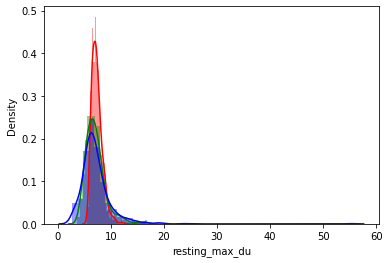

In [5]:
sb.distplot(data["thinking_max_du"], color='r')
# plt.axvline(np.quantile(data["thinking_min_du"], 0.005), color='r')
sb.distplot(data["thinking_and_acting_max_du"], color='g')
# plt.axvline(np.quantile(data[~data["thinking_and_acting_min_du"].isna()]["thinking_and_acting_min_du"], 0.1), color='g')
sb.distplot(data["resting_max_du"], color='b')
# plt.axvline(np.quantile(data["resting_min_du"], 0.5), color='b')

In [6]:
print(max(data["thinking_max_du"]))
print(max(data["thinking_and_acting_max_du"]))
print(max(data["resting_max_du"]))

15.4933
16.8459
55.2482


In [36]:
len(data[data["resting_max_du"] > 12])

40

In [7]:
print(np.quantile(data["thinking_max_du"], 0.99))
print(np.quantile(data[~data["thinking_and_acting_max_du"].isna()]["thinking_and_acting_min_du"], 0.99))
print(np.quantile(data["resting_max_du"], 0.95))

10.851048000000002
11.126782000000002
11.841879999999996


/home/txdat/miniconda3/envs/eeg/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/txdat/miniconda3/envs/eeg/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/txdat/miniconda3/envs/eeg/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function w

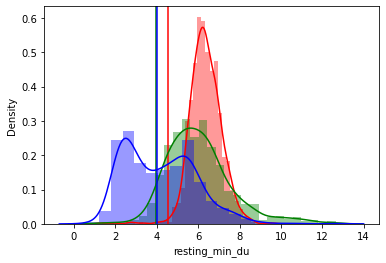

In [17]:
sb.distplot(data["thinking_min_du"], color='r')
plt.axvline(np.quantile(data["thinking_min_du"], 0.01), color='r')
sb.distplot(data["thinking_and_acting_min_du"], color='g')
plt.axvline(np.quantile(data[~data["thinking_and_acting_min_du"].isna()]["thinking_and_acting_min_du"], 0.05), color='g')
sb.distplot(data["resting_min_du"], color='b')
plt.axvline(np.quantile(data["resting_min_du"], 0.5), color='b')

In [14]:
print(np.quantile(data["thinking_min_du"], 0.005))
print(np.quantile(data[~data["thinking_and_acting_min_du"].isna()]["thinking_and_acting_min_du"], 0.05))
print(np.quantile(data["resting_min_du"], 0.5))

3.387784
3.98176
4.0323


In [7]:
# BN002	sample5: invalid thinking (2)
# BN002	sample6: none
# BN002	sample8: wrong label "Thinking and Acting" (2)
# BN003	sample8: wrong label "Thinking and Acting" (2)
# BN099	sample5: invalid thinking (2)
# K027	sample2: invalid thinking (4)
# K312	sample1: wrong label "Thinking" (2)
# K325	sample8: wrong label "Thinking and Acting" (2)
# K327	sample6: none
# K332	sample3: none
# K360	sample5: wrong label "Thinking and Acting" (8)
# K366	sample8: missing "Thinking" (5s-13s)
# K367	sample7: none
# K369	sample6: wrong label "Thinking and Acting" (8)

data[data["n_thinking"] != 3]

,subject,sample,scenario,n_thinking,n_thinking_and_acting,n_resting,thinking_min_du,thinking_max_du,thinking_and_acting_min_du,thinking_and_acting_max_du,resting_min_du,resting_max_du
187,BN002,sample5,há miệng,4,3,6,1.9319,9.7414,6.4064,8.6658,7.6764,9.9595
190,BN002,sample6,gật đầu,4,4,8,7.5808,8.5768,7.1951,8.4420,7.8759,8.7593
184,BN002,sample8,tôi muốn uống nước,2,1,3,8.0921,8.1194,10.6073,10.6073,7.8484,10.9603
510,BN003,sample8,tôi muốn uống nước,2,1,3,6.0953,9.3730,6.3267,6.3267,9.0097,9.4940
375,BN099,sample5,tôi muốn vệ sinh,4,0,4,4.8314,5.8808,NaN,NaN,6.9301,8.2141
103,K027,sample2,nâng chân trái,4,3,7,2.6985,7.3966,6.9153,8.3462,1.9324,8.6112
161,K312,sample1,nâng tay trái,4,2,6,6.6303,9.2302,7.3306,8.3124,5.8310,8.4633
396,K325,sample8,tôi muốn uống nước,2,1,3,6.3977,6.5141,6.4797,6.4797,3.6311,4.6472
552,K327,sample6,gật đầu,4,4,8,6.0478,6.8805,6.1145,6.8635,1.4158,8.2300
73,K332,sample3,nâng chân trái,4,4,8,5.3473,6.0812,6.8137,7.2304,3.2318,8.9136


In [8]:
# BN002	sample6: none
# BN002	sample8: wrong label "Thinking and Acting" (2)
# BN003	sample1: invalid "Thinking and Acting" (1), wrong timestamps
# BN003	sample8: wrong label "Thinking and Acting" (2)
# K004	sample5: invalid "Thinking and Acting" (2)
# K312	sample1: wrong label "Thinking" (2)
# K318	sample8: invalid "Thinking and Acting" (6)
# K325	sample8: wrong label "Thinking and Acting" (2)
# K326	sample6: invalid "Thinking and Acting" (8)
# K327	sample6: none
# K332	sample3: none
# K360	sample5: wrong label "Thinking and Acting" (8)
# K367	sample7: none
# K369	sample6: wrong label "Thinking and Acting" (8)

data[(data["n_thinking_and_acting"] > 0) & (data["n_thinking_and_acting"] != 3)]

,subject,sample,scenario,n_thinking,n_thinking_and_acting,n_resting,thinking_min_du,thinking_max_du,thinking_and_acting_min_du,thinking_and_acting_max_du,resting_min_du,resting_max_du
190,BN002,sample6,gật đầu,4,4,8,7.5808,8.5768,7.1951,8.4420,7.8759,8.7593
184,BN002,sample8,tôi muốn uống nước,2,1,3,8.0921,8.1194,10.6073,10.6073,7.8484,10.9603
515,BN003,sample1,nâng tay trái,3,4,7,8.0620,10.6457,1.0668,9.2108,0.6287,10.9416
510,BN003,sample8,tôi muốn uống nước,2,1,3,6.0953,9.3730,6.3267,6.3267,9.0097,9.4940
566,K004,sample5,tôi muốn vệ sinh,3,1,3,5.4313,6.8175,1.3314,1.3314,3.1993,3.8811
161,K312,sample1,nâng tay trái,4,2,6,6.6303,9.2302,7.3306,8.3124,5.8310,8.4633
537,K318,sample8,tôi muốn uống nước,3,1,3,7.8972,8.0468,2.7987,2.7987,3.0822,6.6653
396,K325,sample8,tôi muốn uống nước,2,1,3,6.3977,6.5141,6.4797,6.4797,3.6311,4.6472
667,K326,sample6,gật đầu,3,4,7,8.3464,8.8469,1.7818,11.8118,1.0160,4.9978
552,K327,sample6,gật đầu,4,4,8,6.0478,6.8805,6.1145,6.8635,1.4158,8.2300


In [9]:
data[data["thinking_max_du"] > 10]

,subject,sample,scenario,n_thinking,n_thinking_and_acting,n_resting,thinking_min_du,thinking_max_du,thinking_and_acting_min_du,thinking_and_acting_max_du,resting_min_du,resting_max_du
310,BN001,sample6,gật đầu,3,3,6,8.6114,11.0638,10.8581,11.3114,6.8722,11.5304
515,BN003,sample1,nâng tay trái,3,4,7,8.0620,10.6457,1.0668,9.2108,0.6287,10.9416
518,BN003,sample2,nâng tay phải,3,3,6,9.5692,11.9291,6.0437,6.6947,10.0445,13.3621
340,K011,sample3,há miệng,3,3,6,5.5817,10.5457,5.2488,7.2793,2.7801,55.2482
405,K299,sample8,tôi muốn uống nước,3,0,3,6.7808,10.7925,NaN,NaN,8.5911,10.1362
32,K300,sample1,nâng tay trái,3,3,6,6.6726,15.0425,3.2131,8.6121,1.4130,13.1090
757,K304,sample1,nâng tay trái,3,3,6,7.9967,10.6299,12.4786,16.5437,3.2326,8.5470
755,K304,sample5,há miệng,3,3,6,7.2817,10.0801,8.5642,9.3966,5.2313,6.7146
158,K312,sample4,nâng chân phải,3,3,6,7.2466,10.0630,7.8632,7.9807,3.1655,6.5138
44,K313,sample2,nâng tay phải,3,3,6,7.4304,10.0809,6.0813,7.5131,6.1312,8.9143


In [32]:
# BN002	sample5: invalid thinking (2) (duration < 2s)
# BN002	sample8: wrong label "Thinking and Acting" (2) [done] -> fixed by scenario

# BN003	sample1: invalid "Thinking and Acting" (1), wrong timestamps (duration < 2s)
# BN003	sample8: wrong label "Thinking and Acting" (2) [done] -> fixed by scenario

# BN099	sample5: invalid thinking (2) [skip using this sample]

# K004	sample5: invalid "Thinking and Acting" (2) (duration < 2s)

# K027	sample2: invalid thinking (4) (duration < 3s)

# K312	sample1: wrong label "Thinking" (2) [done]

# K318	sample8: invalid "Thinking and Acting" (6) [done] -> fixed by scenario

# K325	sample8: wrong label "Thinking and Acting" (2) [done] -> fixed by scenario

# K326	sample6: invalid "Thinking and Acting" (8) (duration < 2s)

# K360	sample5: wrong label "Thinking and Acting" (8) [done]

# K366	sample8: missing "Thinking" (5s-13s) [skip using this sample?]

# K369	sample6: wrong label "Thinking and Acting" (8) [done]

subject = "K305"
sample = "sample1"

sample_dir = f"../data/DataVIN/Official/{subject}/{sample}"

with open(f"{sample_dir}/eeg.json", mode="r", encoding="utf-8") as f:
    print(json.load(f).get("Scenario", "").strip().lower())

raw = mne.io.read_raw_edf(f"{sample_dir}/EEG.edf", preload=False, verbose=False)

# fix--------------
# raw.annotations.description[8] = "Thinking"
# -----------------

annotation = pd.DataFrame(raw.annotations)

df = annotation.copy()

df["onset (1)"] = df["onset"].apply(lambda x: timedelta(seconds=x))
df["offset (1)"] = df.apply(lambda r: timedelta(seconds=r["onset"] + r["duration"]), axis=1)

fixed_edf = f"{sample_dir}/EEG_fixed.edf"
print(fixed_edf)
# raw.export(fixed_edf, fmt="edf", overwrite=True, verbose=False)

df

nâng tay trái
../data/DataVIN/Official/K305/sample1/EEG_fixed.edf


,onset,duration,description,orig_time,onset (1),offset (1)
0,15.3504,16.7938,Resting,2021-10-18 10:07:19+00:00,0 days 00:00:15.350400,0 days 00:00:32.144200
1,32.1443,6.1985,Thinking,2021-10-18 10:07:19+00:00,0 days 00:00:32.144300,0 days 00:00:38.342800
2,38.3438,8.6119,Resting,2021-10-18 10:07:19+00:00,0 days 00:00:38.343800,0 days 00:00:46.955700
3,46.9567,10.1789,Thinking and Acting,2021-10-18 10:07:19+00:00,0 days 00:00:46.956700,0 days 00:00:57.135600
4,57.1366,7.1135,Resting,2021-10-18 10:07:19+00:00,0 days 00:00:57.136600,0 days 00:01:04.250100
5,64.2511,7.2968,Thinking,2021-10-18 10:07:19+00:00,0 days 00:01:04.251100,0 days 00:01:11.547900
6,71.5490,6.6141,Resting,2021-10-18 10:07:19+00:00,0 days 00:01:11.549000,0 days 00:01:18.163100
7,78.1631,10.3124,Thinking and Acting,2021-10-18 10:07:19+00:00,0 days 00:01:18.163100,0 days 00:01:28.475500
8,88.4765,8.1963,Resting,2021-10-18 10:07:19+00:00,0 days 00:01:28.476500,0 days 00:01:36.672800
9,96.6737,7.2144,Thinking,2021-10-18 10:07:19+00:00,0 days 00:01:36.673700,0 days 00:01:43.888100


In [68]:
!mkdir -p ../data/DataVIN/Official_ICA

In [69]:
%matplotib inline
%pylab inline

UsageError: Line magic function `%matplotib` not found.


subject:   0%|                                                                                                                                                                                                                                         | 0/106 [00:00<?, ?it/s]

../data/DataVIN/Official/K300/sample1
Fitting ICA to data using 32 channels (please be patient, this may take a while)
Selecting by number: 32 components
Fitting ICA took 2.2s.
Creating RawArray with float64 data, n_channels=32, n_times=19200
    Range : 0 ... 19199 =      0.000 ...   149.992 secs
Ready.
Opening ica-browser...


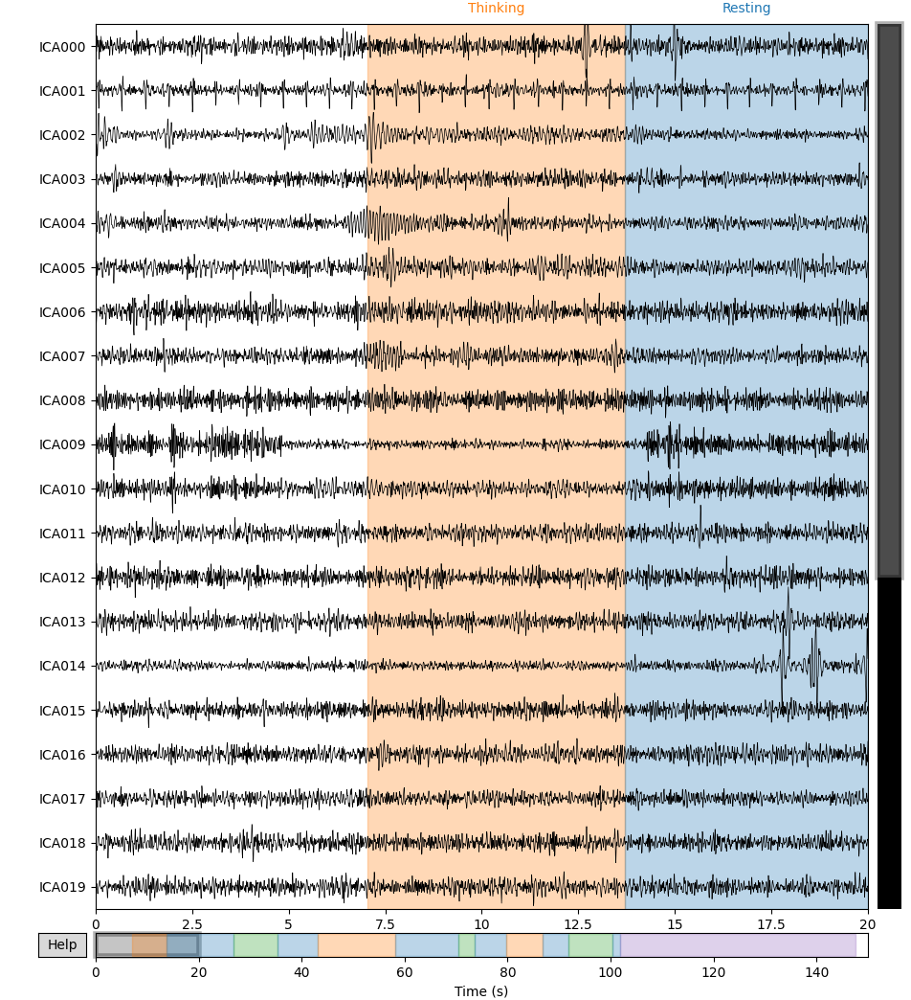

subject:  33%|█████████████████████████████████████████████████████████████████████████▉                                                                                                                                                      | 35/106 [00:02<00:05, 12.67it/s]


In [40]:
%matplotlib widget
for subject in tqdm(sorted(glob.glob("../data/DataVIN/Official/*")), desc="subject"):
    if not subject.endswith("K300"):
        continue
    
    for sample in sorted(glob.glob(f"{subject}/sample*")):
        if not os.path.isdir(sample):
            continue
            
        # if not sample.endswith("sample2"):
        #     continue
            
        print(sample)

        try:
            # ---------------raw and annotation fixing---------------
            with open(f"{sample}/eeg.json", mode="r", encoding="utf-8") as f:
                scenario = json.load(f).get("Scenario", "").strip().lower()

                # fix scenario's name
                if scenario == "nang tay trai":
                    scenario = "nâng tay trái"
                    
                intention_scenario = scenario in {"tôi muốn uống nước", "tôi muốn vệ sinh"}
                
            raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=True, verbose=False)
            
            # fix wrong annotation in some subjects
            # TODO: double check?
            if intention_scenario:
                raw.annotations.description[
                    np.where(raw.annotations.description == "Thinking and Acting")[0]
                ] = "Thinking"

            if sample.endswith("K312/sample1"):
                # wrong label "Thinking" (2)
                raw.annotations.description[2] = "Thinking and Acting"

            elif sample.endswith("K360/sample5"):
                # wrong label "Thinking and Acting" (8)
                raw.annotations.description[8] = "Thinking"

            elif sample.endswith("K369/sample6"):
                # wrong label "Thinking and Acting" (8)
                raw.annotations.description[8] = "Thinking"
                
            # ---------------ica validation--------------------------
            raw = raw.filter(l_freq=8.0, h_freq=30.0, verbose=False)
            
            ica = mne.preprocessing.ICA(n_components=32, max_iter=5000, random_state=42, verbose=False)
            ica.fit(raw)
            
            fig = ica.plot_sources(raw, picks=list(range(32)))
            # plt.close(fig)
            # plt.savefig(f"../data/DataVIN/Official_ICA/{subject[subject.rfind('/') + 1:]}_{sample[sample.rfind('/') + 1:]}.png", bbox_inches='tight')
            # pio.write_html(fig, file=f"../data/DataVIN/Official_ICA/{subject[subject.rfind('/') + 1:]}_{sample[sample.rfind('/') + 1:]}.html", auto_open=False)
        
        except Exception as e:
            print(f"error {sample}:\t{e}")
            
        break
    break

In [180]:
channels = [
    "Fp1", "Fp2",
    "F7", "F3", "Fz", "F4", "F8",
    "FT9", "FC5", "FC1", "FC2", "FC6", "FT10",
    # "FC5", "FC1", "FC2", "FC6",
    "T7", "C3", "Cz", "C4", "T8",
    "CP5", "CP1", "CP2", "CP6",
    "P7", "P3", "Pz", "P4", "P8",
    # "PO9", "PO10",
    # "O1", "Oz", "O2",
    "PO9", "O1", "Oz", "O2", "PO10",
]

print(f"{len(channels)} channels")

32 channels


../data/DataVIN/Official/K300/sample1
nâng tay trái
       onset  duration          description                 orig_time  \
0     7.0360    6.6726             Thinking 2021-07-01 15:50:14+00:00   
1    13.7116   13.1090              Resting 2021-07-01 15:50:14+00:00   
2    26.8234    8.4105  Thinking and Acting 2021-07-01 15:50:14+00:00   
3    35.2369    7.8108              Resting 2021-07-01 15:50:14+00:00   
4    43.0506   15.0425             Thinking 2021-07-01 15:50:14+00:00   
5    58.0951   12.3434              Resting 2021-07-01 15:50:14+00:00   
6    70.4415    3.2131  Thinking and Acting 2021-07-01 15:50:14+00:00   
7    73.6574    6.0176              Resting 2021-07-01 15:50:14+00:00   
8    79.6789    7.0373             Thinking 2021-07-01 15:50:14+00:00   
9    86.7202    5.1106              Resting 2021-07-01 15:50:14+00:00   
10   91.8338    8.6121  Thinking and Acting 2021-07-01 15:50:14+00:00   
11  100.4489    1.4130              Resting 2021-07-01 15:50:14+00:00   

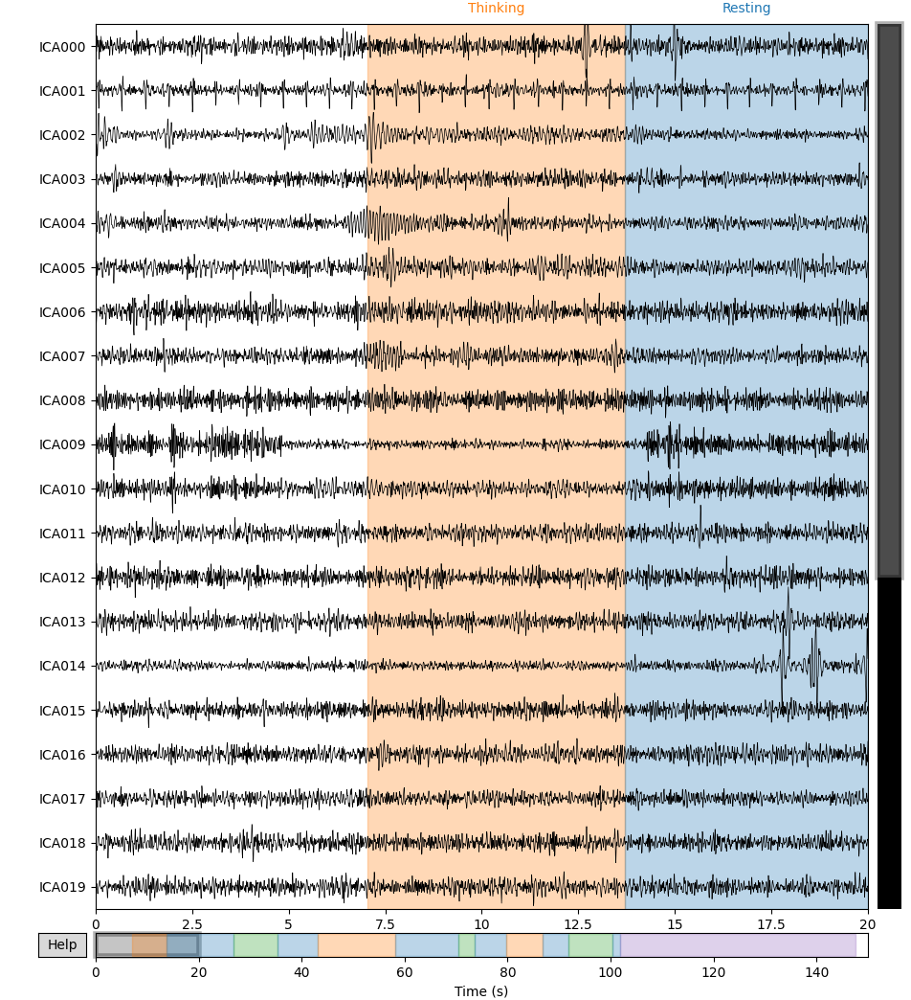

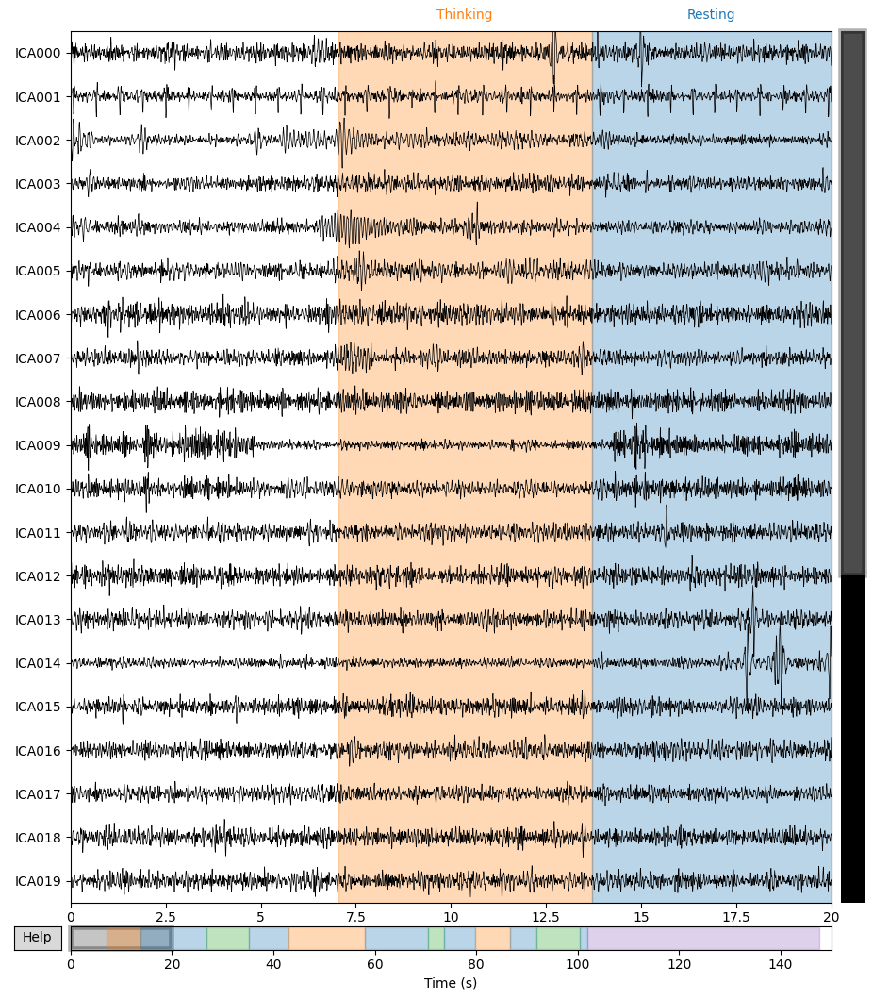

In [181]:
%matplotlib widget

subject = "K300"
sample = "sample1"
sample = f"../data/DataVIN/{'ALS/als-patients' if subject.startswith('ALS') else 'Official'}/{subject}/{sample}"
print(sample)

# ---------------raw and annotation fixing---------------
with open(f"{sample}/eeg.json", mode="r", encoding="utf-8") as f:
    scenario = json.load(f).get("Scenario", "").strip().lower()

# fix scenario's name
if scenario == "nang tay trai":
    scenario = "nâng tay trái"
    
print(scenario)
                    
intention_scenario = scenario in {"tôi muốn uống nước", "tôi muốn vệ sinh"}
                
raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=True, verbose=False)
raw.set_montage("standard_1020")

raw.pick_channels(ch_names=channels, ordered=True)

df = pd.DataFrame(raw.annotations)
df["onset (1)"] = df["onset"].apply(lambda x: timedelta(seconds=x))
df["offset (1)"] = df.apply(lambda r: timedelta(seconds=r["onset"] + r["duration"]), axis=1)
print(df)

# raw = raw.crop(tmin=0, tmax=df[df["description"] == "Typing"].iloc[0]["onset"], include_tmax=False)
            
# fix wrong annotation in some subjects
# TODO: double check?
if intention_scenario:
    raw.annotations.description[
        np.where(raw.annotations.description == "Thinking and Acting")[0]
    ] = "Thinking"

if sample.endswith("K312/sample1"):
    # wrong label "Thinking" (2)
    raw.annotations.description[2] = "Thinking and Acting"

elif sample.endswith("K360/sample5"):
    # wrong label "Thinking and Acting" (8)
    raw.annotations.description[8] = "Thinking"

elif sample.endswith("K369/sample6"):
    # wrong label "Thinking and Acting" (8)
    raw.annotations.description[8] = "Thinking"
                
# ---------------ica validation--------------------------
raw = raw.filter(l_freq=8.0, h_freq=30.0, verbose=False)

# list_of_crop = list()
# for _, r in df.iterrows():
#     if r["description"] in {"Thinking and Acting", "Typing"}:
#         continue
    
#     list_of_crop.append(raw.copy().crop(tmin=r["onset"], tmax=r["onset"] + r["duration"], verbose=False))
                        
# raw = mne.concatenate_raws(list_of_crop)
            
ica = mne.preprocessing.ICA(n_components=len(channels), max_iter=5000, random_state=42, verbose=False)
ica.fit(raw)
            
ica.plot_sources(raw, picks=list(range(len(channels))))

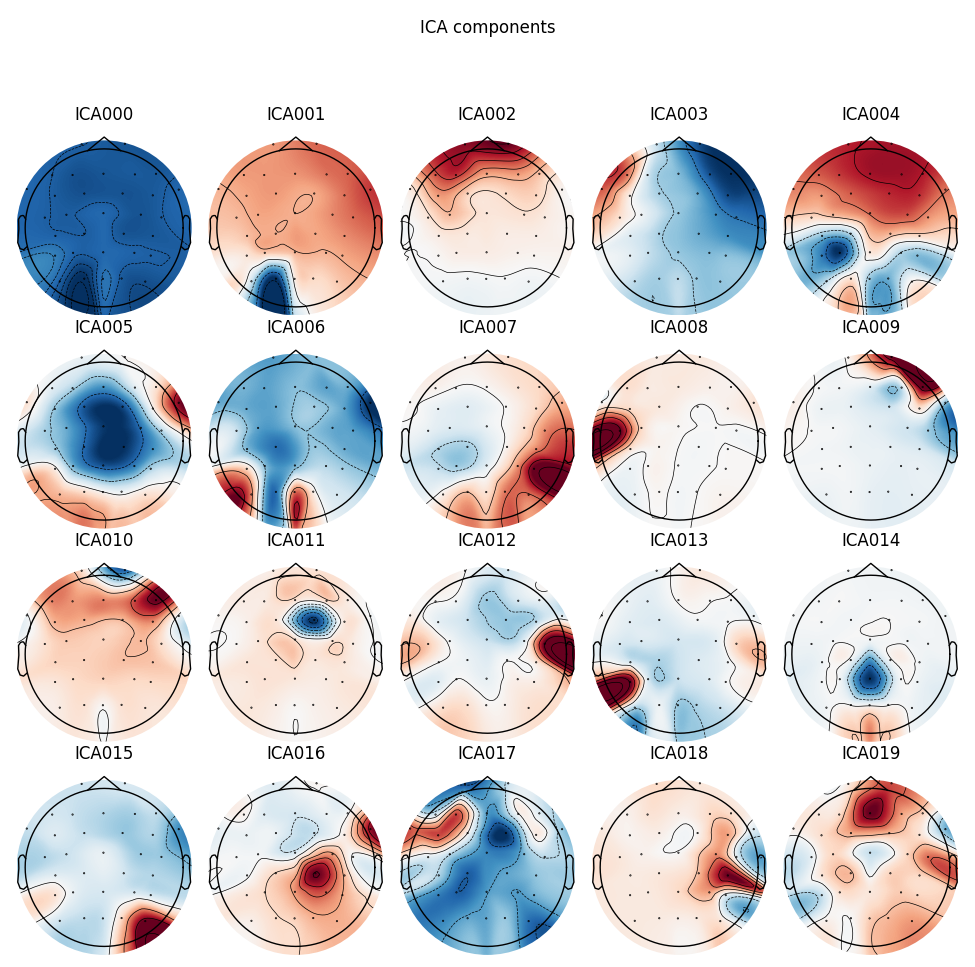

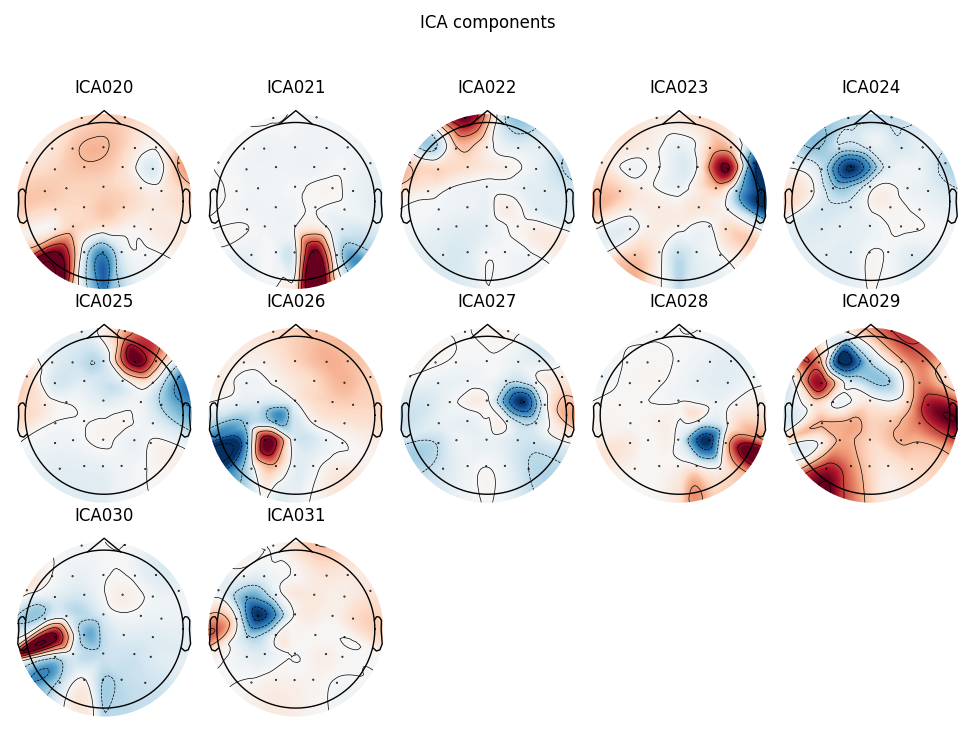

[<MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x731.5 with 12 Axes>]

In [182]:
ica.plot_components()

../data/DataVIN/ALS/als-patients/ALS03_t1/sample2
nâng tay phải
      onset  duration   description                 orig_time  \
0    7.6562    8.2806      Thinking 2022-03-16 16:14:47+00:00   
1   15.9378    6.7631       Resting 2022-03-16 16:14:47+00:00   
2   22.7009    5.0156  Think_Acting 2022-03-16 16:14:47+00:00   
3   27.7165   10.4295       Resting 2022-03-16 16:14:47+00:00   
4   38.1470    6.7466      Thinking 2022-03-16 16:14:47+00:00   
5   44.8947   11.8949       Resting 2022-03-16 16:14:47+00:00   
6   56.7906    6.2653  Think_Acting 2022-03-16 16:14:47+00:00   
7   63.0559    5.8461       Resting 2022-03-16 16:14:47+00:00   
8   68.9019    7.3477      Thinking 2022-03-16 16:14:47+00:00   
9   76.2496    6.7971       Resting 2022-03-16 16:14:47+00:00   
10  83.0477    5.7988  Think_Acting 2022-03-16 16:14:47+00:00   
11  88.8465    1.1535       Resting 2022-03-16 16:14:47+00:00   

                onset (1)             offset (1)  
0  0 days 00:00:07.656200 0 days 00:00:

/tmp/ipykernel_7724/3546819466.py:20: RuntimeWarning: Omitted 1 annotation(s) that were outside data range.
  raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=True, verbose=False)
/tmp/ipykernel_7724/3546819466.py:20: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=True, verbose=False)


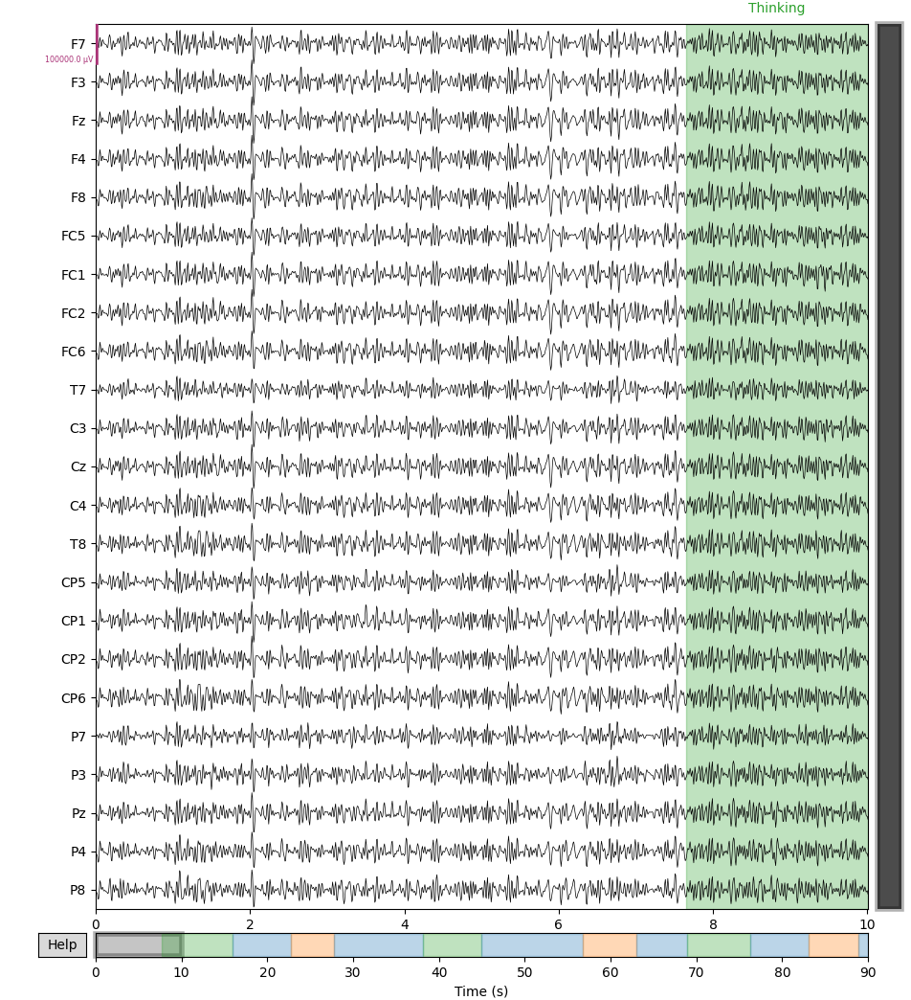

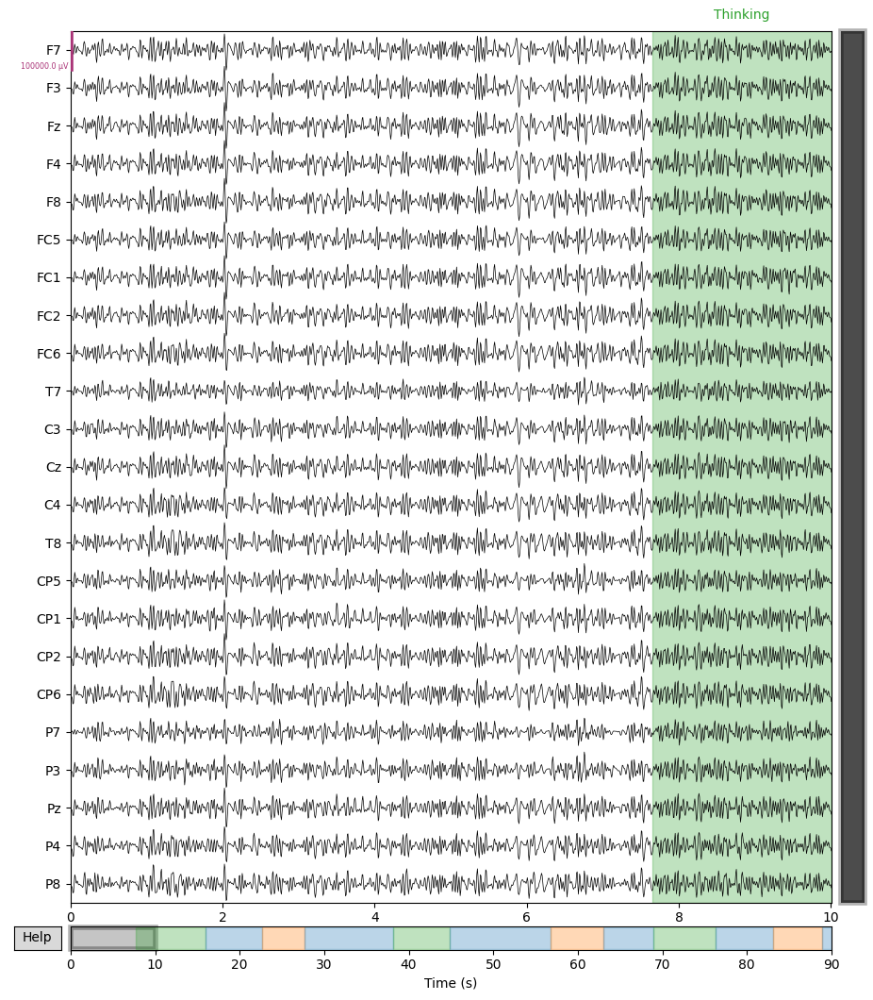

In [177]:
%matplotlib widget

subject = "ALS03_t1"
sample = "sample2"
sample = f"../data/DataVIN/{'ALS/als-patients' if subject.startswith('ALS') else 'Official'}/{subject}/{sample}"
print(sample)

# ---------------raw and annotation fixing---------------
with open(f"{sample}/eeg.json", mode="r", encoding="utf-8") as f:
    scenario = json.load(f).get("Scenario", "").strip().lower()

# fix scenario's name
if scenario == "nang tay trai":
    scenario = "nâng tay trái"
    
print(scenario)
                    
intention_scenario = scenario in {"tôi muốn uống nước", "tôi muốn vệ sinh"}
                
raw = mne.io.read_raw_edf(f"{sample}/EEG.edf", preload=True, verbose=False)
raw.set_montage("standard_1020")

raw.pick_channels(ch_names=channels, ordered=True)

df = pd.DataFrame(raw.annotations)
df["onset (1)"] = df["onset"].apply(lambda x: timedelta(seconds=x))
df["offset (1)"] = df.apply(lambda r: timedelta(seconds=r["onset"] + r["duration"]), axis=1)
print(df)

# raw = raw.crop(tmin=0, tmax=df[df["description"] == "Typing"].iloc[0]["onset"], include_tmax=False)
            
# fix wrong annotation in some subjects
# TODO: double check?
if intention_scenario:
    raw.annotations.description[
        np.where(raw.annotations.description == "Thinking and Acting")[0]
    ] = "Thinking"

if sample.endswith("K312/sample1"):
    # wrong label "Thinking" (2)
    raw.annotations.description[2] = "Thinking and Acting"

elif sample.endswith("K360/sample5"):
    # wrong label "Thinking and Acting" (8)
    raw.annotations.description[8] = "Thinking"

elif sample.endswith("K369/sample6"):
    # wrong label "Thinking and Acting" (8)
    raw.annotations.description[8] = "Thinking"
                
# ---------------ica validation--------------------------
raw = raw.filter(l_freq=8.0, h_freq=30.0, verbose=False)
# raw.apply_function(lambda x: x * 1e6)
# raw.apply_function(lambda x: exponential_moving_standardize(x, factor_new=1e-3, init_block_size=None)[0]) 

raw.plot(n_channels=len(channels), scalings={"eeg": 5e-2})

# list_of_crop = list()
# for _, r in df.iterrows():
#     if r["description"] in {"Thinking and Acting", "Typing"}:
#         continue
    
#     list_of_crop.append(raw.copy().crop(tmin=r["onset"], tmax=r["onset"] + r["duration"], verbose=False))
                        
# raw = mne.concatenate_raws(list_of_crop)
            
# ica = mne.preprocessing.ICA(n_components=len(channels), max_iter=5000, random_state=42, verbose=False)
# ica.fit(raw)
            
# ica.plot_sources(raw, picks=list(range(len(channels))))

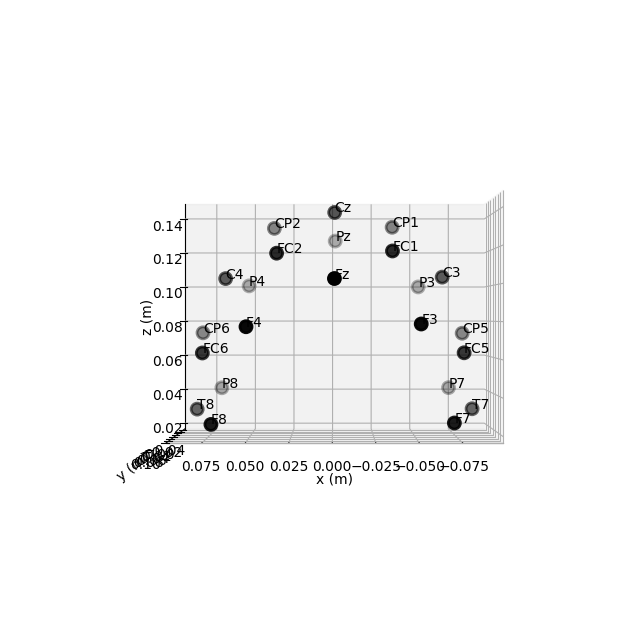

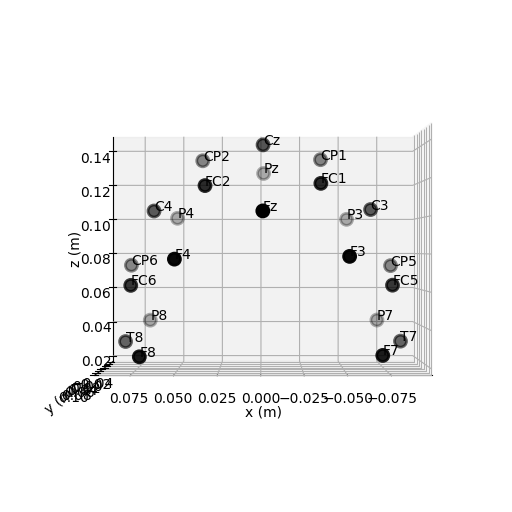

In [148]:
raw.plot_sensors(kind='3d', show_names=True, ch_type='all')

Left:	['P7', 'P3', 'CP5', 'CP1', 'T7', 'C3', 'FC5', 'FC1', 'FT9', 'F7', 'F3']
Midline:	['Pz', 'Cz', 'Fz']
Right:	['P8', 'P4', 'CP6', 'CP2', 'T8', 'C4', 'FC6', 'FC2', 'FT10', 'F4', 'F8']
4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.
Creating RawArray with float64 data, n_channels=90, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


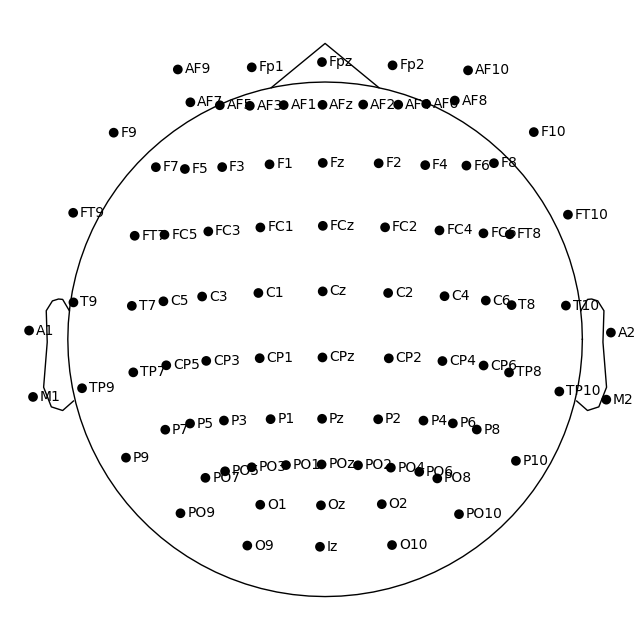

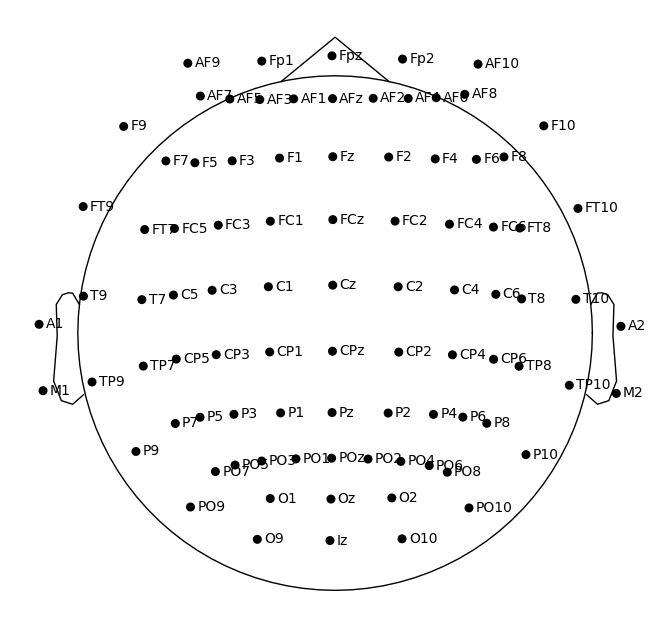

In [117]:
for k, v in mne.channels.make_1020_channel_selections(raw.info).items():
    print(f"{k}:\t{[channels[i] for i in v]}")
    
mne.channels.make_standard_montage(kind="standard_1020").plot()
# raw.plot_sensors(show_names=True)

Creating RawArray with float64 data, n_channels=32, n_times=17280
    Range : 0 ... 17279 =      0.000 ...   134.992 secs
Ready.
Opening ica-browser...


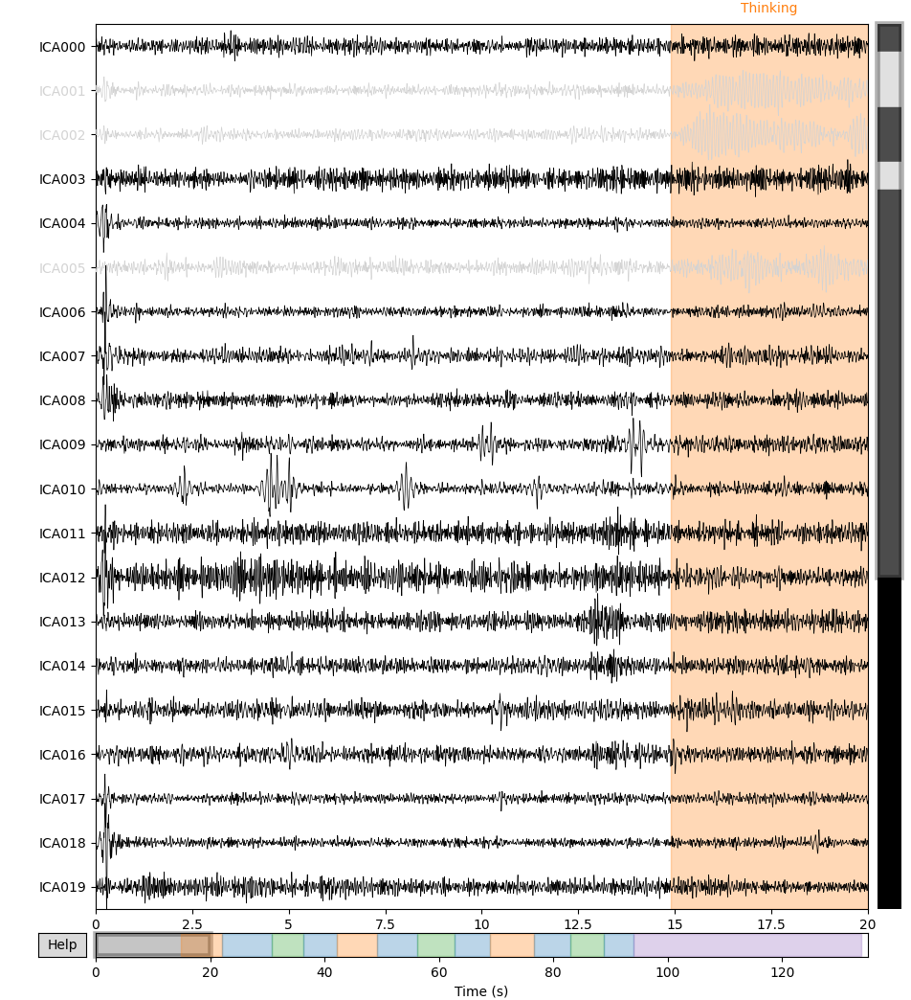

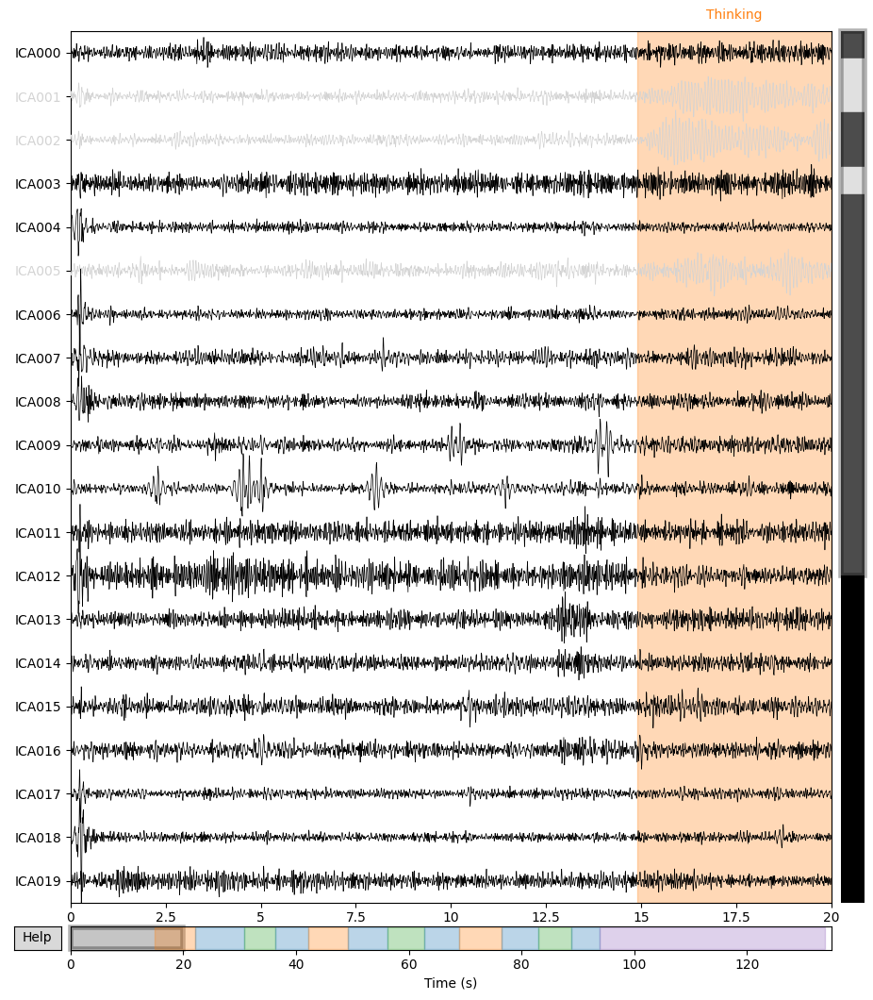

In [28]:
ica.exclude = [1,2,5]

ica.plot_sources(raw)
# ica.plot_overlay(raw, exclude=[1,2,5])

In [143]:
pd.DataFrame(raw.annotations)

,onset,duration,description,orig_time
0,25.390625,10.094275,Thinking,2022-01-27 09:32:52+00:00
1,35.484900,0.007287,Resting,2022-01-27 09:32:52+00:00
2,35.492188,0.000000,BAD boundary,2022-01-27 09:32:52+00:00
3,35.492188,0.000000,EDGE boundary,2022-01-27 09:32:52+00:00
4,35.492188,0.000525,Thinking,2022-01-27 09:32:52+00:00
5,35.492713,11.464000,Resting,2022-01-27 09:32:52+00:00
6,46.956713,0.004225,Thinking,2022-01-27 09:32:52+00:00
7,46.960937,0.003588,Resting,2022-01-27 09:32:52+00:00
8,46.960938,0.000000,BAD boundary,2022-01-27 09:32:52+00:00
9,46.960938,0.000000,EDGE boundary,2022-01-27 09:32:52+00:00


In [140]:
events, event_id = mne.events_from_annotations(raw)

events

Used Annotations descriptions: ['Resting', 'Thinking', 'Typing']


array([[ 3250,     0,     2],
       [ 4542,     0,     1],
       [ 4543,     0,     2],
       [ 4543,     0,     1],
       [ 6010,     0,     2],
       [ 6011,     0,     1],
       [ 6011,     0,     2],
       [ 7446,     0,     1],
       [ 7447,     0,     1],
       [ 8977,     0,     2],
       [ 8978,     0,     2],
       [10362,     0,     1],
       [10363,     0,     1],
       [11453,     0,     3]])

In [141]:
epochs = mne.Epochs(
    raw,
    events[np.where(events[:, 2] == 2)[0]],
    event_id=event_id,
    tmin=0,
    tmax=6,
    baseline=None,
    preload=True,
    proj=False,
    on_missing="ignore",
    event_repeated="drop",
    verbose=False,
)

    Using multitaper spectrum estimation with 7 DPSS windows


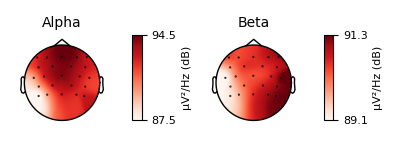

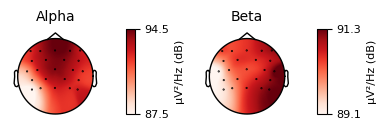

In [142]:
epochs.plot_psd_topomap(bands=[(8, 12, "Alpha"), (12, 30, "Beta")])
# epochs.plot_psd()

In [36]:
ica.exclude = [1,2,5]

reconst_raw = raw.copy()
ica.apply(reconst_raw)

Applying ICA to Raw instance
    Transforming to ICA space (32 components)
    Zeroing out 3 ICA components
    Projecting back using 32 PCA components


<RawEDF | EEG.edf, 32 x 17280 (135.0 s), ~4.3 MB, data loaded>

In [37]:
epochs = mne.Epochs(
    reconst_raw,
    events[np.where(events[:, 2] == 2)[0]],
    event_id=event_id,
    tmin=0,
    tmax=6,
    baseline=None,
    preload=True,
    proj=False,
    on_missing="ignore",
    event_repeated="drop",
    verbose=False,
)

    Using multitaper spectrum estimation with 7 DPSS windows


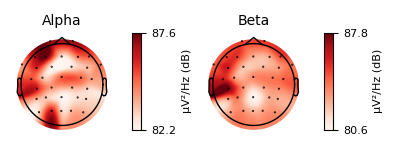

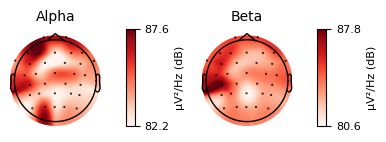

In [39]:
epochs.plot_psd_topomap(bands=[(8, 12, "Alpha"), (12, 30, "Beta")])
# epochs.plot_psd()

In [48]:
len(raw.times)

17664

In [45]:
et = pd.read_csv(f"{sample}/ET.csv")
et["TimeStamp"] = np.cumsum(np.diff(et["TimeStamp"], prepend=et["TimeStamp"][0]))

et

,TimeStamp,x,y,character typing,sentence
0,0.000000,-1.0,-1.0,EMPTY_ET_STREAM,MainMenu
1,0.016560,-1.0,-1.0,EMPTY_ET_STREAM,MainMenu
2,0.032652,-1.0,-1.0,EMPTY_ET_STREAM,MainMenu
3,0.049803,-1.0,-1.0,EMPTY_ET_STREAM,MainMenu
4,0.066534,-1.0,-1.0,EMPTY_ET_STREAM,MainMenu
...,...,...,...,...,...
8385,140.220086,-1.0,-1.0,EMPTY_ET_STREAM,MainMenu
8386,140.236866,-1.0,-1.0,EMPTY_ET_STREAM,MainMenu
8387,140.253819,-1.0,-1.0,EMPTY_ET_STREAM,MainMenu
8388,140.269918,-1.0,-1.0,EMPTY_ET_STREAM,MainMenu


In [66]:
with open(f"{sample}/EEGTimeStamp.txt", mode="r", encoding="utf-8") as f:
    ts = np.array([float(line.strip()) for line in f], dtype=np.float64)
    ts = np.cumsum(np.diff(ts, prepend=ts[0])).astype(np.float32)

In [67]:
np.where(raw.times != ts)[0]

array([   32,    33,    34, ..., 17661, 17662, 17663])

In [78]:
len(ts) / (ts[-1] - ts[0])

128.00782713167536

In [79]:
len(raw.times) / (raw.times[-1] - raw.times[0])

128.00724678706902

In [71]:
ett = np.array(et["TimeStamp"], dtype=np.float32)

In [80]:
len(ett) / (ett[-1] - ett[0])

59.80583149424562

In [7]:
rng = np.random.RandomState(seed=42)

In [11]:
for alpha in [0.1, 0.2, 0.3, 0.4]:
    sb.distplot(rng.beta(1.0, alpha, (512,)), hist=True)

/home/txdat/miniconda3/envs/eeg/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/txdat/miniconda3/envs/eeg/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/txdat/miniconda3/envs/eeg/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function w